<a href="https://colab.research.google.com/github/pablo-s-dev/Machine-learning/blob/main/Regression/gradient_descent.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [156]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.animation import FuncAnimation
from sklearn.linear_model import LinearRegression
from IPython.display import HTML
import time
%matplotlib inline

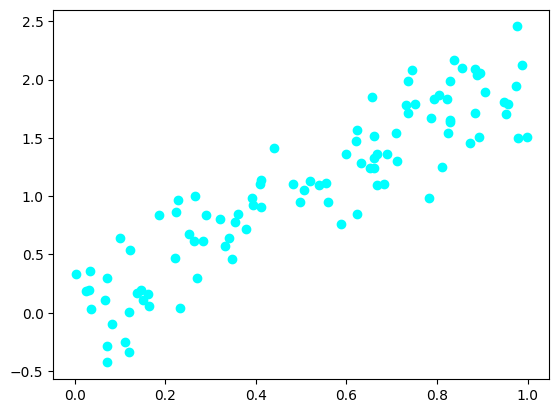

In [157]:
x_train = np.random.random_sample(100)
y_train = 2* x_train + (np.random.random_sample(100) - np.random.random_sample(100)) / 1.5

param_path = {
    'w': [],
    'b': []
}


fig = plt.gcf()
ax = plt.gca()

ax.scatter(x_train, y_train, zorder = 1, color='cyan')
line,  = ax.plot([], [], zorder = 2, color ='black')

def init():  
    line.set_data([], [])  
    return line,  

def animate(frame):
  w = param_path['w'][frame]
  b = param_path['b'][frame]

  line.set_data(x_train, w * x_train + b, )

  return (line,)


492
492


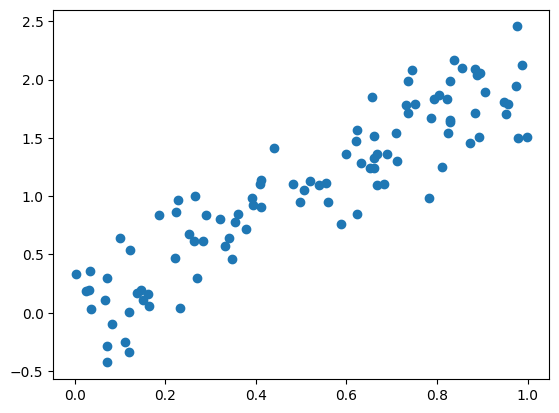

In [158]:

def gradient_descent(x_train, y_train, w = 0, b = 0, lrate = 0.1):

  
  plt.scatter(x_train, y_train)

  def dj_db(w, b):
    e = 1e-6
    step = 0.001

    y_hat = lambda x: w * x + b
    new_y_hat = lambda x: w * x + (b + step)

    delta_j = calc_error(new_y_hat, y_train, x_train) - calc_error(y_hat, y_train, x_train)

    if(abs(delta_j) < e):
      return 0

    return delta_j / step

  def dj_dw(w, b):
    step = 1e-6
    e = 1e-10

    y_hat = lambda x: w * x + b
    new_y_hat = lambda x: (w + step) * x + b

    delta_j: float = calc_error(new_y_hat, y_train, x_train) - calc_error(y_hat, y_train, x_train)

    if(abs(delta_j) < e ):
      return 0

    return delta_j / step

  i = 0

  while (i < 1e6):

    new_w = w - lrate * dj_dw(w, b)
    new_b = b - lrate * dj_db(w, b)

    if( new_w == w and new_b == b):

      return lambda x: w * x + b

    w = new_w
    b = new_b

    param_path['w'].append(w)
    param_path['b'].append(b)

    i += 1

  return lambda x: w * x + b



def calc_error(y_hat, y, x) -> float:
  m = len(y_train)

  squared_sum = 0
  for i in range(m):
    squared_sum += (y_hat(x[i]) - y[i]) ** 2

  return squared_sum / m


y_hat = gradient_descent(x_train, y_train)

anim = FuncAnimation(func= animate ,fig=fig, frames= len(param_path['w']), init_func = init, blit=True)
anim